<a href="https://colab.research.google.com/github/hrhodaeian/INSE-6220-Project/blob/main/INSE_6220_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Install PyCaret**

PyCaret is an open-source, low-code machine learning library in Python designed to make the end-to-end machine learning process easier and faster for both beginners and experienced data scientists. It offers a variety of tools and functions for data preparation, model training, model selection, and deployment.

pip3 install pycaret==2.3.6 is a command used to install a specific version of the PyCaret library in Python. If you encounter an error message, try running the code again.

In [ ]:
# install slim version (default): if you get an error message, run it again one or more times: 
!pip3 install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

## **Principal Component Analysis**

PCA stands for Principal Component Analysis, and it is a widely used technique in data analysis and machine learning for reducing the dimensionality of large datasets. The basic idea behind PCA is to transform a set of high-dimensional variables into a smaller set of uncorrelated variables called principal components, while retaining as much of the original variance as possible.

**Import Libraries**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


**Dataset**

This project uses a dataset of 300 pizzas from 10 different brands, containing information about the ingredients used, including their respective amounts of water (mois), protein (prot), fat, ash, sodium, carbohydrates (carb), and calories (cal) per 100 grams. The main goal is to train a model to predict the pizza brand based on the nutrient values. The dataset includes a sample ID for each pizza, but it will not be relevant to the project and will be removed. The class label is represented by the pizza brand, which was originally labeled as A to J, but later changed to 1 to 10. Here's a brief description of the variables in the pizza dataset:

1. brand: Pizza brand (class label)
2. id: Sample ID
3. mois: Water content per 100g of a pizza sample
4. prot: Protein content per 100g of a pizza sample
5. fat: Fat content per 100g of a pizza sample
6. ash: Ash content per 100g of a pizza sample
7. sodium: Sodium content per 100g of a pizza sample
8. carb: Carbohydrate content per 100g of a pizza sample
9. cal: Calorie content per 100g of a pizza sample
The data was obtained from the Kaggle website: https://www.kaggle.com/datasets/sdhilip/nutrient-analysis-of-pizzas

**Read the dataset**

**pd.read_csv** is a function in the pandas library in Python that is used to read a CSV (Comma Separated Values) file and convert it into a pandas DataFrame.

In [ ]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/hrhodaeian/INSE-6220-Project/main/Pizza.csv')
df.head(25)

,brand,id,mois,prot,fat,ash,sodium,carb,cal
0,A,14069,27.82,21.43,44.87,5.11,1.77,0.77,4.93
1,A,14053,28.49,21.26,43.89,5.34,1.79,1.02,4.84
2,A,14025,28.35,19.99,45.78,5.08,1.63,0.80,4.95
3,A,14016,30.55,20.15,43.13,4.79,1.61,1.38,4.74
4,A,14005,30.49,21.28,41.65,4.82,1.64,1.76,4.67
5,A,14075,31.14,20.23,42.31,4.92,1.65,1.40,4.67
6,A,14082,31.21,20.97,41.34,4.71,1.58,1.77,4.63
7,A,14097,28.76,21.41,41.60,5.28,1.75,2.95,4.72
8,A,14117,28.22,20.48,45.10,5.02,1.71,1.18,4.93
9,A,14133,27.72,21.19,45.29,5.16,1.66,0.64,4.95


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   brand   300 non-null    object 
 1   id      300 non-null    int64  
 2   mois    300 non-null    float64
 3   prot    300 non-null    float64
 4   fat     300 non-null    float64
 5   ash     300 non-null    float64
 6   sodium  300 non-null    float64
 7   carb    300 non-null    float64
 8   cal     300 non-null    float64
dtypes: float64(7), int64(1), object(1)
memory usage: 21.2+ KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  5


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Removing the id column and defining the class column**

---



**NOTE:** As per the data description, the "id" column in the dataset was considered unnecessary for the analysis and was removed.

In [ ]:
# Removing ID column
df=df.drop(['id'], axis=1)

# Defining the class column
y = df['brand']
target = df['brand'].to_numpy()

**Exploratory Data Analysis**

**sns.pairplot** is a function in the seaborn library in Python that is used to plot pairwise relationships between multiple variables in a dataset. The resulting plot is a grid of scatterplots, with each variable plotted against every other variable.

**Note:** categorical classificaton changed to numerical classification.

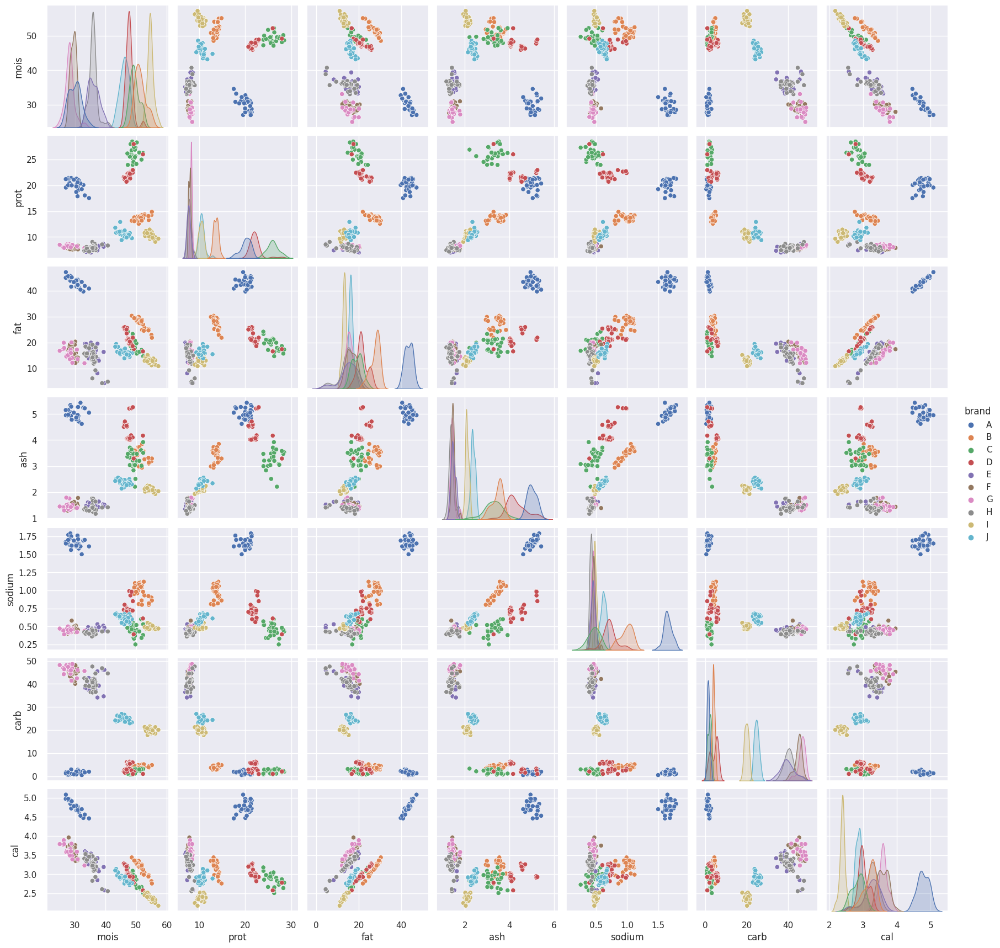

In [ ]:
# Pair Plot
sns.pairplot(df, hue='brand')
plt.show()
# categorial classification changed to numerical classification
df['brand'].replace(['A', 'B', 'C', 'D', 'E', 'F','G','H','I','J'],[1,2,3,4,5,6,7,8,9,10], inplace=True)

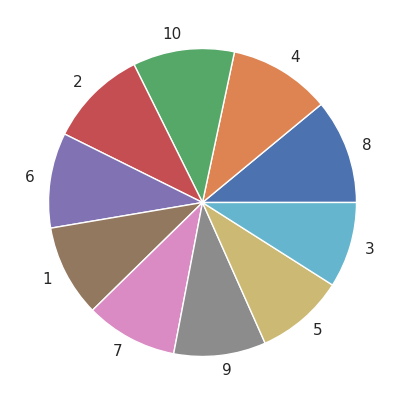

In [ ]:
y =df['brand']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [ ]:
X = df.drop(columns=['brand'])
X.head(10)

,mois,prot,fat,ash,sodium,carb,cal
0,27.82,21.43,44.87,5.11,1.77,0.77,4.93
1,28.49,21.26,43.89,5.34,1.79,1.02,4.84
2,28.35,19.99,45.78,5.08,1.63,0.80,4.95
3,30.55,20.15,43.13,4.79,1.61,1.38,4.74
4,30.49,21.28,41.65,4.82,1.64,1.76,4.67
5,31.14,20.23,42.31,4.92,1.65,1.40,4.67
6,31.21,20.97,41.34,4.71,1.58,1.77,4.63
7,28.76,21.41,41.60,5.28,1.75,2.95,4.72
8,28.22,20.48,45.10,5.02,1.71,1.18,4.93
9,27.72,21.19,45.29,5.16,1.66,0.64,4.95


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
mois,300.0,40.903067,9.552987,25.00,30.9025,43.300,49.1150,57.22
prot,300.0,13.373567,6.434392,6.98,8.0600,10.440,20.0225,28.48
fat,300.0,20.229533,8.975658,4.38,14.7700,17.135,21.4350,47.20
ash,300.0,2.633233,1.269724,1.17,1.4500,2.225,3.5925,5.43
sodium,300.0,0.669400,0.370358,0.25,0.4500,0.490,0.7025,1.79
carb,300.0,22.864767,18.029722,0.51,3.4675,23.245,41.3375,48.64
cal,300.0,3.271000,0.620034,2.18,2.9100,3.215,3.5200,5.08


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,mois,prot,fat,ash,sodium,carb,cal
0,-1.371815,1.254181,2.749841,1.953894,2.976687,-1.227511,2.680129
1,-1.301562,1.227717,2.640475,2.135338,3.030779,-1.213622,2.534733
2,-1.316242,1.030010,2.851396,1.930227,2.598042,-1.225844,2.712439
3,-1.085563,1.054918,2.555660,1.701449,2.543950,-1.193622,2.373183
4,-1.091854,1.230830,2.390494,1.725116,2.625088,-1.172510,2.260097
5,-1.023699,1.067372,2.464149,1.804005,2.652134,-1.192510,2.260097
6,-1.016359,1.182571,2.355898,1.638338,2.462812,-1.171954,2.195477
7,-1.273252,1.251068,2.384914,2.088005,2.922595,-1.106398,2.340872
8,-1.329873,1.106290,2.775509,1.882894,2.814410,-1.204733,2.680129
9,-1.382300,1.216819,2.796713,1.993338,2.679180,-1.234733,2.712439


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
mois,300.0,-1.184238e-16,1.001671,-1.667503,-1.048601,0.251329,0.861056,1.710899
prot,300.0,1.894781e-16,1.001671,-0.995315,-0.827187,-0.456682,1.035069,2.351687
fat,300.0,-2.368476e-16,1.001671,-1.768786,-0.609276,-0.345346,0.134528,3.009866
ash,300.0,-5.210647e-16,1.001671,-1.154329,-0.933440,-0.322051,0.756755,2.206338
sodium,300.0,-2.368476e-16,1.001671,-1.134311,-0.593390,-0.485206,0.089522,3.030779
carb,300.0,-4.736952e-17,1.001671,-1.241956,-1.077647,0.021124,1.026283,1.431985
cal,300.0,1.894781e-16,1.001671,-1.762520,-0.583199,-0.090468,0.402262,2.922456


**Observations and variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

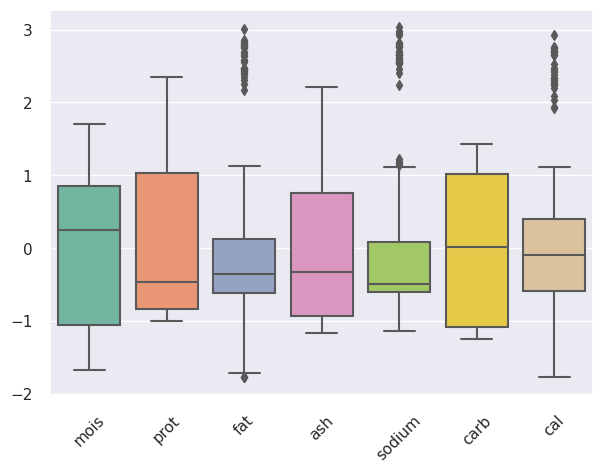

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

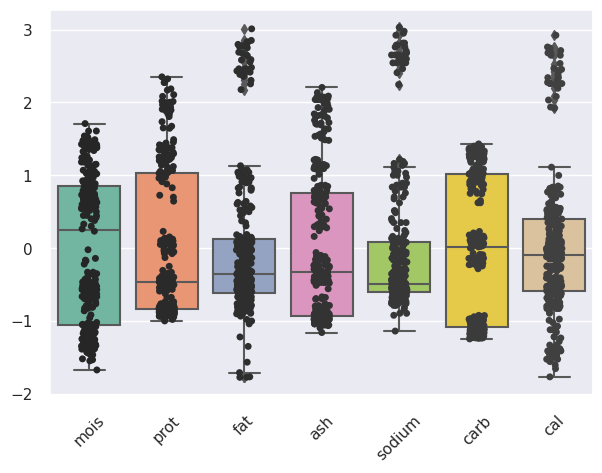

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

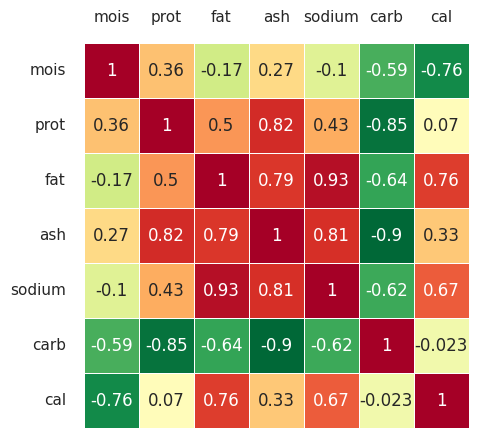

In [ ]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Applying PCA**

Text(0, 0.5, '$Z_2$')

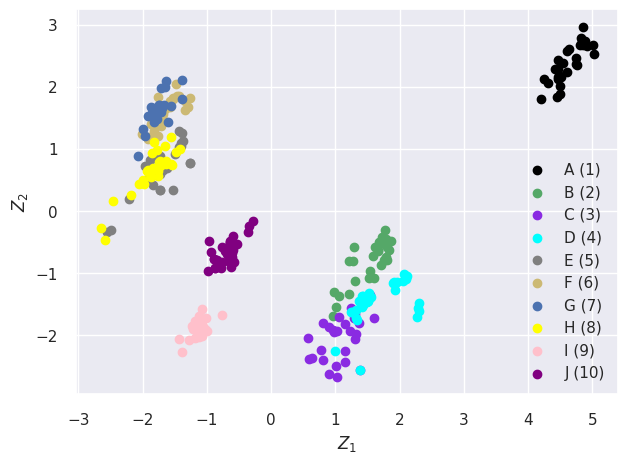

In [ ]:
pca = PCA()
Z = pca.fit_transform(X)

idx_A = np.where(y == 1)
idx_B = np.where(y == 2)
idx_C = np.where(y == 3)
idx_D = np.where(y == 4)
idx_E = np.where(y == 5)
idx_F = np.where(y == 6)
idx_G = np.where(y == 7)
idx_H = np.where(y == 8)
idx_I = np.where(y == 9)
idx_J = np.where(y == 10)

# Scatter Plot
plt. figure()
plt.scatter(Z[idx_A,0], Z[idx_A,1], c='black', label='A (1)')
plt.scatter(Z[idx_B,0], Z[idx_B,1], c='g', label='B (2)')
plt.scatter(Z[idx_C,0], Z[idx_C,1], c='blueviolet', label='C (3)')
plt.scatter(Z[idx_D,0], Z[idx_D,1], c='cyan', label='D (4)')
plt.scatter(Z[idx_E,0], Z[idx_E,1], c='gray', label='E (5)')
plt.scatter(Z[idx_F,0], Z[idx_F,1], c='y', label='F (6)')
plt.scatter(Z[idx_G,0], Z[idx_G,1], c='b', label='G (7)')
plt.scatter(Z[idx_H,0], Z[idx_H,1], c='yellow', label='H (8)')
plt.scatter(Z[idx_I,0], Z[idx_I,1], c='pink', label='I (9)')
plt.scatter(Z[idx_J,0], Z[idx_J,1], c='purple', label='J (10)')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

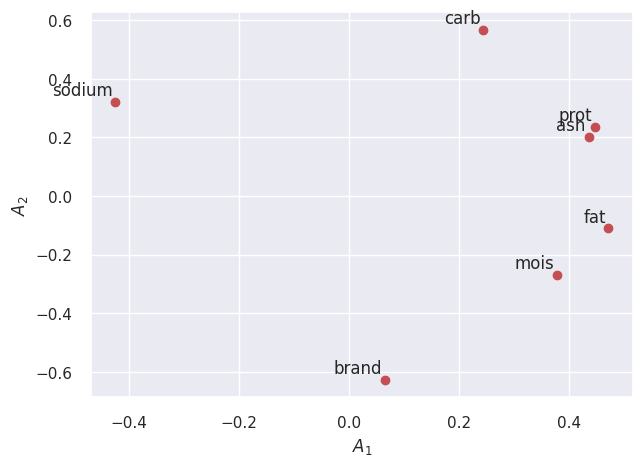

In [ ]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

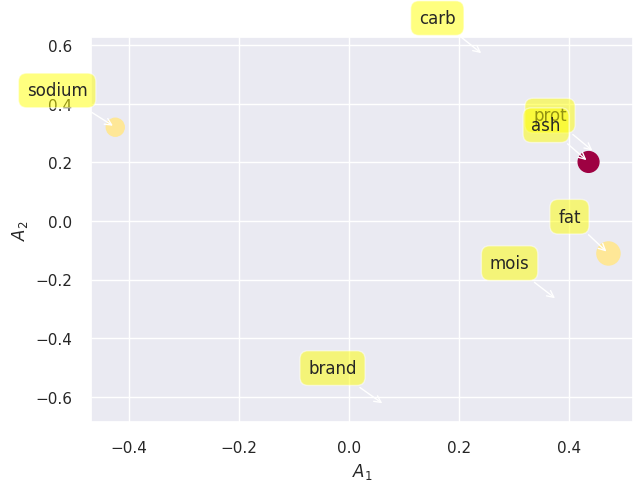

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

[4.18573434e+00 2.29811778e+00 4.15948838e-01 9.54925358e-02
 2.77695834e-02 3.38738483e-04 9.55061572e-06]


Text(0, 0.5, 'Explained variance')

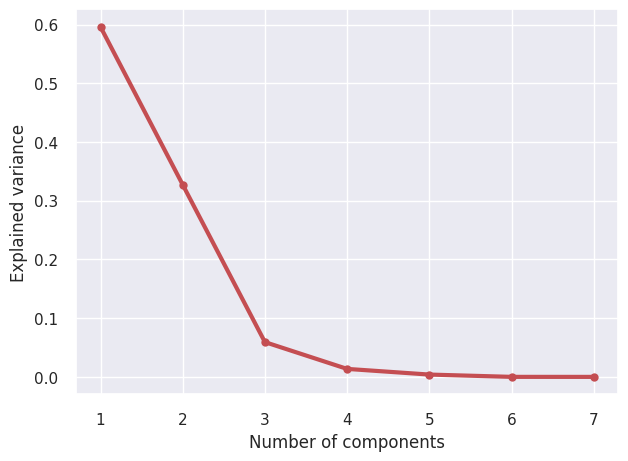

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 
print(Lambda)

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

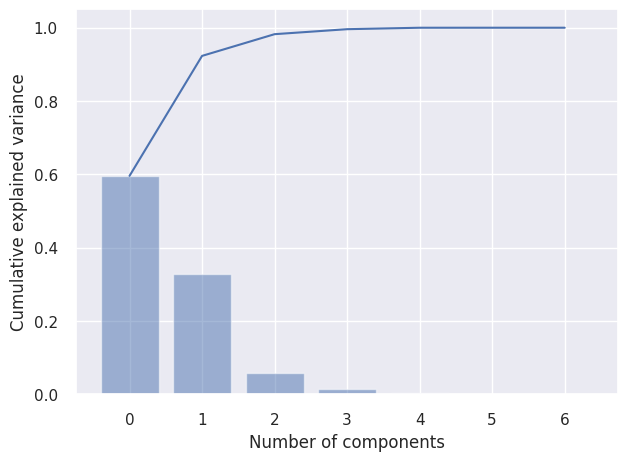

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

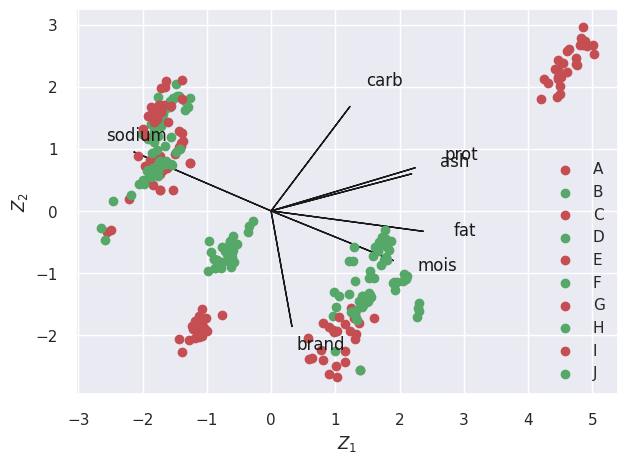

In [ ]:
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')
plt.scatter(Z[idx_A,0], Z[idx_A,1], c='r', label='A')
plt.scatter(Z[idx_B,0], Z[idx_B,1], c='g', label='B')
plt.scatter(Z[idx_C,0], Z[idx_C,1], c='r', label='C')
plt.scatter(Z[idx_D,0], Z[idx_D,1], c='g', label='D')
plt.scatter(Z[idx_E,0], Z[idx_E,1], c='r', label='E')
plt.scatter(Z[idx_F,0], Z[idx_F,1], c='g', label='F')
plt.scatter(Z[idx_G,0], Z[idx_G,1], c='r', label='G')
plt.scatter(Z[idx_H,0], Z[idx_H,1], c='g', label='H')
plt.scatter(Z[idx_I,0], Z[idx_I,1], c='r', label='I')
plt.scatter(Z[idx_J,0], Z[idx_J,1], c='g', label='J')
plt.legend(loc='lower right')

##**Using PCA Library**

In [ ]:
!pip3 install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2,PC3
0,5.010343,2.679215,-0.039327
1,5.023755,2.529295,-0.097056
2,4.805439,2.673700,-0.075475
3,4.469543,2.285029,-0.120233
4,4.471893,2.159152,-0.000738
...,...,...,...
295,-0.535510,-0.530843,-0.426490
296,-0.339636,-0.243230,-0.281174
297,-0.646433,-0.515434,-0.370378
298,-0.865078,-0.921790,-0.493755


**Scatter plot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.59%] of the variance'}, xlabel='PC1 (59.5% expl.var)', ylabel='PC2 (32.7% expl.var)'>)

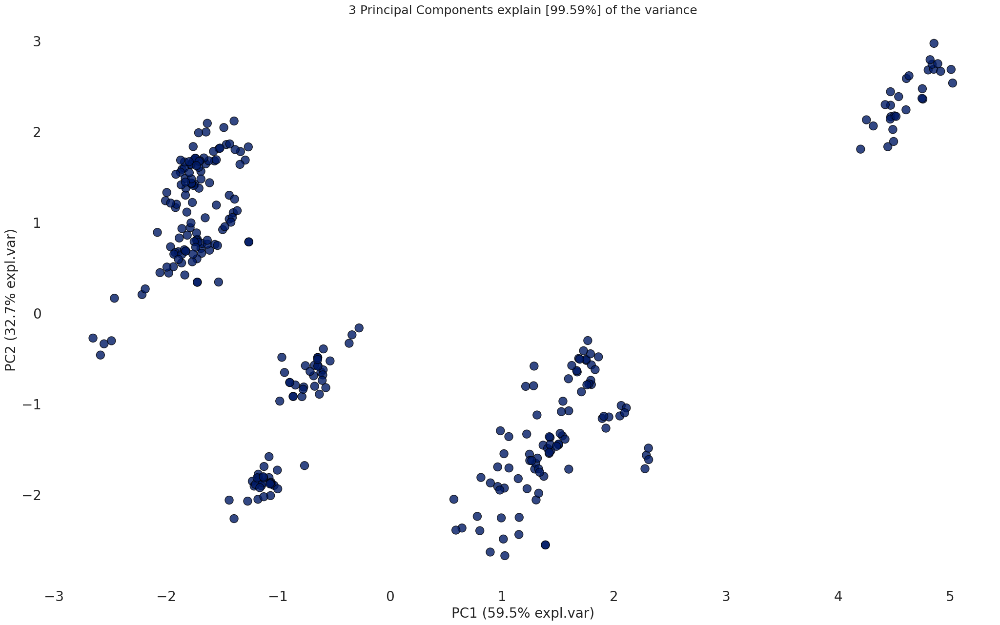

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvector Matrix**

In [ ]:
A = out['loadings'].T
print(A)

             PC1       PC2       PC3
mois    0.064709 -0.628276 -0.421669
prot    0.378761 -0.269707  0.746027
fat     0.446666  0.234379 -0.199309
ash     0.471890 -0.110990  0.056273
sodium  0.435703  0.201662 -0.455169
carb   -0.424914  0.320312  0.052237
cal     0.244487  0.567458  0.113316


**Eigenvector Plot**

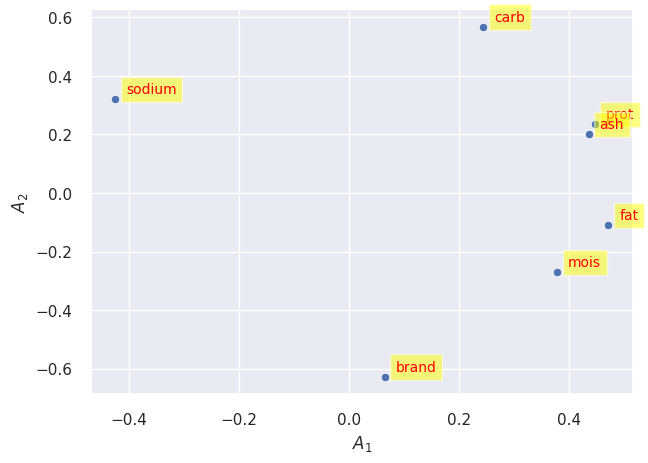

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

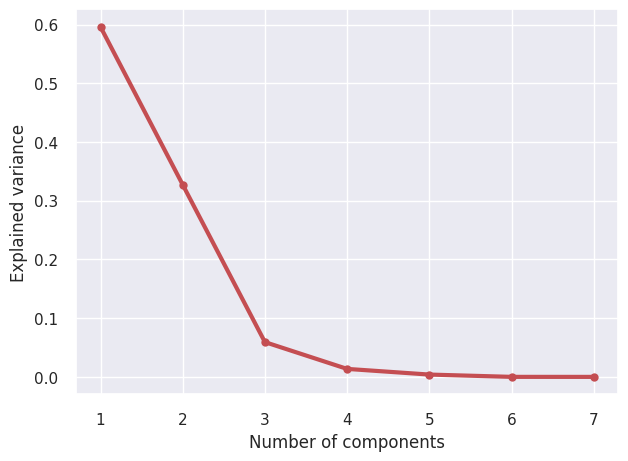

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

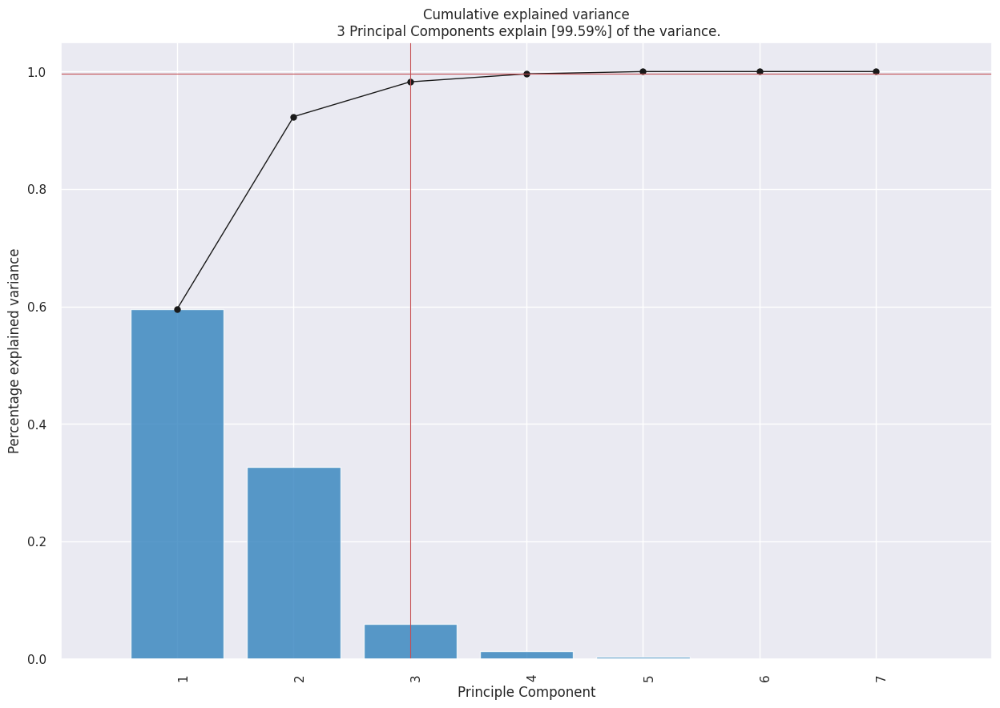

<Figure size 700x500 with 0 Axes>

In [ ]:
model.plot();

**Biplot**

A biplot is a graphical representation of multivariate data that displays both observations and variables simultaneously in a single plot. Each observation is represented as a point in a two-dimensional plot, while the variables are represented as arrows or vectors that point in the direction of the greatest variation in the data. The length of the vector indicates the magnitude of the variable, while the angle between two vectors reflects their correlation.

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


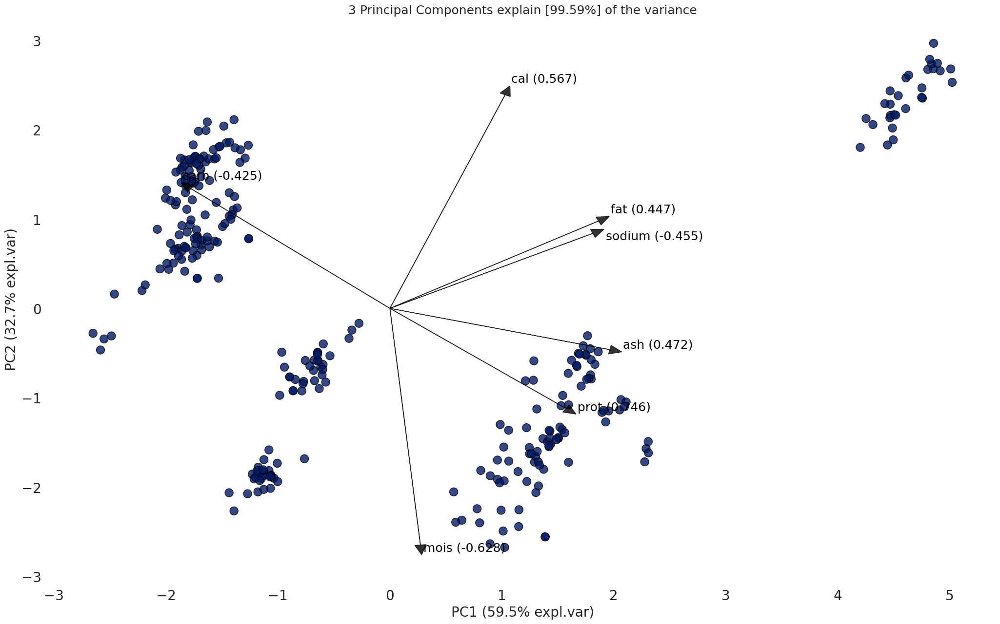

(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.59%] of the variance'}, xlabel='PC1 (59.5% expl.var)', ylabel='PC2 (32.7% expl.var)'>)

In [ ]:
model.biplot(label=False, legend=False)

#**Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Using PyCaret**

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook. The enable_colab() function in PyCaret is used to install and configure all the necessary dependencies to use PyCaret in Google Colab.

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


**Data Splitting**

In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [ ]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (270, 8)
Unseen Data For Predictions: (30, 8)


**Setting up the Environment in PyCaret**

The **setup()** function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline.

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='brand', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,brand
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(270, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='brand',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

**Comparing all Machine Learning Models**

In [ ]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9044,0.9918,0.9100,0.9126,0.8956,0.8933,0.8978,0.153
rf,Random Forest Classifier,0.8991,0.9958,0.9050,0.9047,0.8854,0.8876,0.8939,0.147
et,Extra Trees Classifier,0.8936,0.9922,0.9000,0.9028,0.8837,0.8814,0.8863,0.124
nb,Naive Bayes,0.8827,0.9903,0.8900,0.8934,0.8755,0.8693,0.8733,0.015
lda,Linear Discriminant Analysis,0.8775,0.9879,0.8850,0.8750,0.8619,0.8634,0.8696,0.015
knn,K Neighbors Classifier,0.8725,0.9811,0.8800,0.8762,0.8591,0.8579,0.8638,0.019
lr,Logistic Regression,0.8716,0.9869,0.8800,0.8849,0.8635,0.8569,0.8611,0.743
gbc,Gradient Boosting Classifier,0.8512,0.9865,0.8600,0.8509,0.8386,0.8342,0.8416,0.840
dt,Decision Tree Classifier,0.8345,0.9079,0.8450,0.8229,0.8126,0.8156,0.8235,0.015
qda,Quadratic Discriminant Analysis,0.8137,0.9667,0.8217,0.7748,0.7729,0.7924,0.8071,0.016


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 2
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Naive Bayes ('nb')
* K Neighbors Classifier ('knn')
* Extra Tree Classifier ('et')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create Naive Bayes**

In [ ]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7895,0.9938,0.8000,0.8246,0.7825,0.7654,0.7702
1,0.8421,0.9876,0.8500,0.8246,0.8316,0.8241,0.8266
2,0.9474,0.9876,0.9500,0.9649,0.9439,0.9414,0.9443
3,0.7895,0.9752,0.8000,0.7895,0.7895,0.7654,0.7654
4,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
5,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
6,0.8947,0.9938,0.9000,0.8947,0.8947,0.8827,0.8827
7,0.9474,0.9876,0.9500,0.9649,0.9439,0.9410,0.9439
8,0.8889,0.9913,0.9000,0.9352,0.8852,0.8763,0.8824
9,0.8333,0.9861,0.8500,0.8056,0.7963,0.8144,0.8288


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 3
INFO:logs:GaussianNB(priors=None, var_smoothing=1e-09)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
#trained model object is stored in the variable 'nb'. 
nb

GaussianNB(priors=None, var_smoothing=1e-09)

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Naive Bayes**

In [ ]:
tuned_nb = tune_model(nb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9938,0.8500,0.8947,0.8316,0.8241,0.8318
1,0.8421,0.9876,0.8500,0.8246,0.8316,0.8241,0.8266
2,0.9474,0.9876,0.9500,0.9649,0.9439,0.9414,0.9443
3,0.7895,0.9752,0.8000,0.7895,0.7895,0.7654,0.7654
4,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
5,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
6,0.8947,0.9938,0.9000,0.8947,0.8947,0.8827,0.8827
7,0.9474,0.9876,0.9500,0.9649,0.9439,0.9410,0.9439
8,0.8889,0.9913,0.9000,0.9352,0.8852,0.8763,0.8824
9,0.8333,0.9861,0.8500,0.8056,0.7963,0.8144,0.8288


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 5
INFO:logs:GaussianNB(priors=None, var_smoothing=9e-07)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
#tuned model object is stored in the variable 'tuned_nb'. 
tuned_nb

GaussianNB(priors=None, var_smoothing=9e-07)

**Evaluate Naive Bayes**

In [ ]:
#Update statmodels
#!pip3 install statsmodels --upgrade

How to analyze model performance using various plots

In [ ]:
evaluate_model(tuned_nb)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GaussianNB(priors=None, var_smoothing=9e-07), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9845,0.8500,0.8070,0.8035,0.8241,0.8371
1,0.8421,0.9969,0.8500,0.8158,0.8070,0.8246,0.8376
2,0.7895,0.9489,0.8000,0.7895,0.7895,0.7654,0.7654
3,0.8421,0.9783,0.8500,0.8596,0.8386,0.8241,0.8266
4,0.8421,0.9938,0.8500,0.8070,0.8035,0.8241,0.8371
5,0.9474,0.9938,0.9500,0.9649,0.9439,0.9414,0.9443
6,0.9474,0.9969,0.9500,0.9649,0.9439,0.9414,0.9443
7,0.8947,0.9660,0.9000,0.9386,0.8912,0.8824,0.8879
8,0.8889,0.9653,0.9000,0.9259,0.8815,0.8759,0.8820
9,0.8889,0.9861,0.9000,0.8889,0.8889,0.8759,0.8759


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune K Neighbors Model**

In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8421,0.9644,0.8500,0.8070,0.8035,0.8241,0.8371
1,0.9474,0.9706,0.9500,0.9649,0.9439,0.9414,0.9443
2,0.8421,0.9319,0.8500,0.8596,0.8386,0.8241,0.8266
3,0.8421,0.9350,0.8500,0.8596,0.8386,0.8241,0.8266
4,0.8421,0.9675,0.8500,0.8070,0.8035,0.8241,0.8371
5,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
6,0.9474,0.9938,0.9500,0.9649,0.9439,0.9414,0.9443
7,0.8947,0.9397,0.9000,0.9386,0.8912,0.8824,0.8879
8,0.8889,0.9375,0.9000,0.9259,0.8815,0.8759,0.8820
9,0.8889,0.9861,0.9000,0.8333,0.8519,0.8759,0.8882


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 7
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=2, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K Neighbors Model**

In [ ]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=2, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Extra Trees Classifier**

In [ ]:
et = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
1,0.8947,0.9907,0.9000,0.8421,0.8596,0.8827,0.8938
2,0.8947,0.9845,0.9000,0.9298,0.8877,0.8827,0.8882
3,0.8421,0.9783,0.8500,0.8596,0.8386,0.8241,0.8266
4,0.7895,0.9876,0.8000,0.7368,0.7544,0.7654,0.7751
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8947,0.9938,0.9000,0.8947,0.8947,0.8827,0.8827
7,0.8947,0.9938,0.9000,0.9386,0.8912,0.8824,0.8879
8,0.8333,0.9931,0.8500,0.8981,0.8259,0.8144,0.8229
9,0.9444,1.0000,0.9500,0.9630,0.9407,0.9379,0.9412


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 8
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

**Tune Extra Trees Classifier**

In [ ]:
tuned_et = tune_model(et)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8947,0.9938,0.9000,0.9298,0.8877,0.8827,0.8882
1,0.8947,0.9845,0.9000,0.8421,0.8596,0.8827,0.8938
2,0.8947,0.9845,0.9000,0.8947,0.8947,0.8827,0.8827
3,0.7895,0.9752,0.8000,0.7895,0.7754,0.7654,0.7702
4,0.9474,0.9876,0.9500,0.9649,0.9439,0.9414,0.9443
5,0.9474,1.0000,0.9500,0.9649,0.9439,0.9414,0.9443
6,0.8947,0.9907,0.9000,0.8947,0.8947,0.8827,0.8827
7,0.8947,0.9876,0.9000,0.9386,0.8912,0.8824,0.8879
8,0.9444,0.9826,0.9500,0.9630,0.9407,0.9379,0.9412
9,0.9444,0.9931,0.9500,0.9630,0.9407,0.9379,0.9412


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 9
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Extra Trees classifier**

In [ ]:
tuned_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [ ]:
evaluate_model(tuned_et)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA**

In [ ]:
clf_pca = setup(data=df, target='brand', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,brand
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(300, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='brand',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='brand')),
                ('fix_perfect', Remove_100(target='brand')),
                ('clean_names', Clean_Colum_Names()),
       

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.8900,0.9885,0.8933,0.9094,0.8831,0.8772,0.8818,0.023
knn,K Neighbors Classifier,0.8857,0.9787,0.8833,0.8863,0.8783,0.8724,0.8752,0.035
et,Extra Trees Classifier,0.8807,0.9852,0.8833,0.8817,0.8707,0.8669,0.8715,0.231
rf,Random Forest Classifier,0.8757,0.9897,0.8800,0.8807,0.8661,0.8613,0.8663,0.184
lda,Linear Discriminant Analysis,0.8757,0.9905,0.8800,0.8962,0.8679,0.8614,0.8668,0.014
gbc,Gradient Boosting Classifier,0.8564,0.9747,0.8600,0.8756,0.8523,0.8399,0.8433,0.544
qda,Quadratic Discriminant Analysis,0.8560,0.9835,0.8600,0.8634,0.8478,0.8391,0.8427,0.016
dt,Decision Tree Classifier,0.8519,0.9175,0.8550,0.8499,0.8381,0.8351,0.8409,0.021
lightgbm,Light Gradient Boosting Machine,0.8417,0.9813,0.8433,0.8626,0.8373,0.8232,0.8265,0.162
lr,Logistic Regression,0.8083,0.9785,0.8100,0.7607,0.7716,0.7861,0.7959,0.054


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 2
INFO:logs:GaussianNB(priors=None, var_smoothing=1e-09)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model_pca

GaussianNB(priors=None, var_smoothing=1e-09)


**Tune the Best Model after PCA (Naive Bayes)**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8571,0.9823,0.8667,0.9048,0.8603,0.8405,0.8469
1,0.9524,1.0000,0.9500,0.9683,0.9492,0.9470,0.9494
2,0.9048,0.9799,0.9000,0.9048,0.9048,0.8939,0.8939
3,0.9048,0.9897,0.9000,0.9325,0.8971,0.8937,0.8982
4,0.8571,0.9845,0.8667,0.8730,0.8540,0.8409,0.8430
5,0.9048,0.9948,0.9333,0.9524,0.8968,0.8945,0.9036
6,0.9048,0.9897,0.9000,0.9325,0.8971,0.8937,0.8982
7,0.9048,0.9900,0.9167,0.9365,0.9016,0.8937,0.8982
8,0.8095,0.9850,0.8000,0.7897,0.7701,0.7863,0.7986
9,0.9000,0.9889,0.9000,0.9000,0.9000,0.8883,0.8883


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 3
INFO:logs:GaussianNB(priors=None, var_smoothing=2e-09)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

GaussianNB(priors=None, var_smoothing=2e-09)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GaussianNB(priors=None, var_smoothing=2e-09), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model after PCA**

In [ ]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8095,0.9395,0.8333,0.8333,0.8032,0.7873,0.7934
1,0.8571,0.9850,0.8500,0.8730,0.8540,0.8409,0.8430
2,0.9524,0.9687,0.9500,0.9683,0.9492,0.9470,0.9494
3,0.8095,0.9848,0.8167,0.8095,0.8095,0.7879,0.7879
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.8571,0.9845,0.8833,0.8651,0.8571,0.8413,0.8434
6,0.8571,0.9634,0.8500,0.8159,0.8183,0.8401,0.8510
7,0.8571,0.9687,0.8000,0.8254,0.8381,0.8397,0.8418
8,0.8571,0.9925,0.8500,0.8730,0.8540,0.8401,0.8422
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune K Neighbors Model**

In [ ]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8571,0.9382,0.8667,0.8730,0.8540,0.8401,0.8422
1,0.8571,0.9875,0.8500,0.8730,0.8540,0.8409,0.8430
2,0.9524,0.9687,0.9500,0.9683,0.9492,0.9470,0.9494
3,0.8571,0.9898,0.8667,0.8730,0.8540,0.8409,0.8430
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.8571,0.9634,0.9000,0.8000,0.8163,0.8421,0.8616
6,0.8571,0.9634,0.8500,0.8159,0.8183,0.8401,0.8510
7,0.8571,0.9448,0.8667,0.8730,0.8571,0.8405,0.8426
8,0.8095,0.9662,0.8167,0.8413,0.8063,0.7873,0.7914
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 7
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K Neighbors Model**

In [ ]:
evaluate_model(tuned_knn_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Extra Trees Classifier after PCA**

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9048,0.9925,0.9000,0.9206,0.9016,0.8934,0.8957
1,0.9048,0.9975,0.9000,0.9206,0.9016,0.8939,0.8962
2,0.9048,0.9799,0.9000,0.9048,0.9048,0.8939,0.8939
3,0.9048,0.9662,0.9000,0.9365,0.8984,0.8939,0.8985
4,0.9048,0.9948,0.9167,0.9048,0.9048,0.8939,0.8939
5,0.8571,0.9962,0.9000,0.8000,0.8163,0.8421,0.8616
6,0.8571,0.9793,0.8500,0.8159,0.8183,0.8401,0.8510
7,0.8571,0.9635,0.8667,0.8730,0.8571,0.8405,0.8426
8,0.7619,0.9900,0.7500,0.7738,0.7574,0.7328,0.7347
9,0.9500,0.9917,0.9500,0.9667,0.9467,0.9441,0.9468


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 8
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Extra Trees Classifier**

In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8095,0.9848,0.8333,0.8952,0.8084,0.7879,0.8021
1,0.9524,0.9975,0.9500,0.9683,0.9492,0.9470,0.9494
2,0.9048,0.9875,0.9000,0.9048,0.9048,0.8939,0.8939
3,0.9048,0.9848,0.9000,0.9325,0.8971,0.8937,0.8982
4,0.9524,0.9923,0.9500,0.9643,0.9478,0.9468,0.9493
5,0.9048,0.9897,0.9333,0.9524,0.8968,0.8945,0.9036
6,0.9048,0.9947,0.9167,0.9206,0.9016,0.8939,0.8962
7,0.9524,0.9822,0.9500,0.9683,0.9492,0.9467,0.9491
8,0.8571,0.9875,0.8500,0.8254,0.8222,0.8401,0.8510
9,0.9500,0.9889,0.9500,0.9667,0.9467,0.9441,0.9468


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 9
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Extra Trees Classifier**

In [ ]:
evaluate_model(tuned_et_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties. 

SHAP is a Python library for model interpretation and feature importance analysis, and it provides a variety of tools for explaining the output of machine learning models. The library is based on the Shapley value, a concept from cooperative game theory that assigns a value to each player in a game based on their contribution to the overall outcome.

In [ ]:
!pip3 install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 kB 26.2 MB/s eta 0:00:00


In [ ]:
#import the SHAP (SHapley Additive exPlanations) library
import shap

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9048,0.9925,0.9000,0.9206,0.9016,0.8934,0.8957
1,0.9048,0.9975,0.9000,0.9206,0.9016,0.8939,0.8962
2,0.9048,0.9799,0.9000,0.9048,0.9048,0.8939,0.8939
3,0.9048,0.9662,0.9000,0.9365,0.8984,0.8939,0.8985
4,0.9048,0.9948,0.9167,0.9048,0.9048,0.8939,0.8939
5,0.8571,0.9962,0.9000,0.8000,0.8163,0.8421,0.8616
6,0.8571,0.9793,0.8500,0.8159,0.8183,0.8401,0.8510
7,0.8571,0.9635,0.8667,0.8730,0.8571,0.8405,0.8426
8,0.7619,0.9900,0.7500,0.7738,0.7574,0.7328,0.7347
9,0.9500,0.9917,0.9500,0.9667,0.9467,0.9441,0.9468


INFO:logs:create_model_container: 24
INFO:logs:master_model_container: 24
INFO:logs:display_container: 10
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8095,0.9848,0.8333,0.8952,0.8084,0.7879,0.8021
1,0.9524,0.9975,0.9500,0.9683,0.9492,0.9470,0.9494
2,0.9048,0.9875,0.9000,0.9048,0.9048,0.8939,0.8939
3,0.9048,0.9848,0.9000,0.9325,0.8971,0.8937,0.8982
4,0.9524,0.9923,0.9500,0.9643,0.9478,0.9468,0.9493
5,0.9048,0.9897,0.9333,0.9524,0.8968,0.8945,0.9036
6,0.9048,0.9947,0.9167,0.9206,0.9016,0.8939,0.8962
7,0.9524,0.9822,0.9500,0.9683,0.9492,0.9467,0.9491
8,0.8571,0.9875,0.8500,0.8254,0.8222,0.8401,0.8510
9,0.9500,0.9889,0.9500,0.9667,0.9467,0.9441,0.9468


INFO:logs:create_model_container: 25
INFO:logs:master_model_container: 25
INFO:logs:display_container: 11
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples.

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


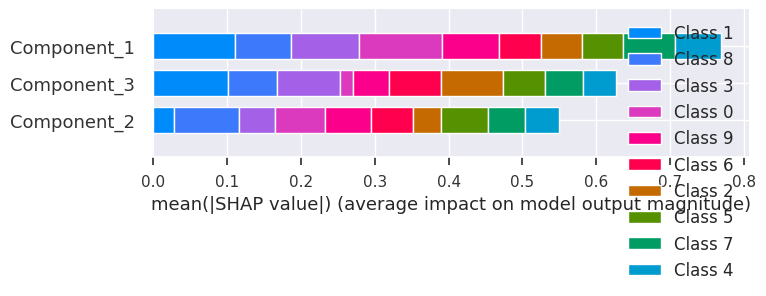

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_et_pca, plot='summary')

In [ ]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [ ]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_et_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_impurity_split=None,
                     min_samples_leaf=5, min_samples_split=10,
                     min_weight_fraction_leaf=0.0, n_estimators=150, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
